**1. Apply PCA to the images from folder '360 Rocks'. How many components do you need to preserve 95% of the variance?**

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import warnings
warnings.filterwarnings('ignore') #Ignoring the warning messages

from PIL import Image
import os
import numpy as np
import pandas as pd
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import seaborn as sns
import math

from sklearn.preprocessing import MinMaxScaler
from matplotlib.offsetbox import AnnotationBbox, OffsetImage
from sklearn.preprocessing import LabelEncoder
from skimage.transform import resize

from sklearn.manifold import TSNE
from sklearn.manifold import LocallyLinearEmbedding
from sklearn.manifold import MDS
from scipy.spatial import procrustes
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.mixture import GaussianMixture

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.preprocessing.image import ImageDataGenerator

In [ ]:
image_dir = '/content/drive/My Drive/360 Rocks'

In [ ]:
!cp -r '/content/drive/My Drive/360 Rocks' '/content/'

In [ ]:
images = []

# Loop through the files in the folder
for filename in os.listdir(image_dir):
    if filename.endswith('.jpg') or filename.endswith('.png'):
        # Open and load the image
        img = Image.open(os.path.join(image_dir, filename))
        new_size = (img.width // 2, img.height // 2)
        #resized_img = img.resize(new_size, Image.ANTIALIAS)
        resized_img = img.resize(new_size)
        # Convert the image to a numpy array
        img_data = np.array(resized_img)
        # Flatten the image into a 1D vector and append to the list
        images.append(img_data)
images = np.stack(images) # Stacking the 'images' list along a new axis to create a new array
print(f"Original 'images' shape is: {images.shape}")
print("*"*100)

# Determining the Height, Width & Channels for rehaping the 'images' list
num_samples, height, width, channels = images.shape
images = images.reshape(num_samples, height * width * channels)
print(f"New shape for 'images' shape is: {images.shape}")
print("*"*100)

#Implementing PCA
pca = PCA()
pca.fit(images)

# Finding the number of Components required to preserve 95% of the variance
cumulative_explained_variance = np.cumsum(pca.explained_variance_ratio_)
n_components_95_variance = np.argmax(cumulative_explained_variance >= 0.95) + 1

print(f"Number of components needed to preserve 95% of variance: {n_components_95_variance}")

Original 'images' shape is: (360, 400, 400, 3)
****************************************************************************************************
New shape for 'images' shape is: (360, 480000)
****************************************************************************************************
Number of components needed to preserve 95% of variance: 222


**2. Plot 10 images of your choice in the original form (without PCA) and then plot their reconstruction (projection in the original space) after you kept 95% of variance using PCA.**

The shape of the reduced images is: (360, 222)
The shape of the recovered images is: (360, 400, 400, 3)
The shape of the reshaped original images is: (360, 400, 400, 3)


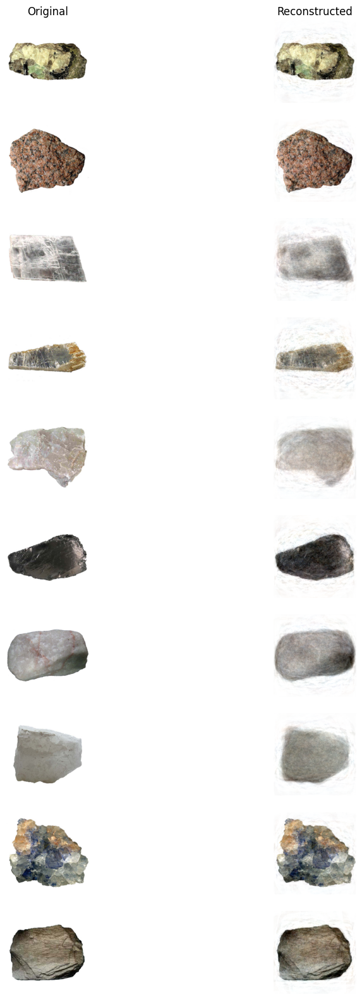

In [ ]:
# Transforming the images while saving 95% of the variance
pca = PCA(0.95)
X_reduced = pca.fit_transform(images)
print(f"The shape of the reduced images is: {X_reduced.shape}")
# Recovering and Reshaping the recovered images back to (num_images, height, width, channels)
X_recovered = pca.inverse_transform(X_reduced)
X_recovered = X_recovered.reshape(num_samples, height,width,channels)
print(f"The shape of the recovered images is: {X_recovered.shape}")
# Reshaping the 'images' to the original shape
images = images.reshape(num_samples, height,width,channels)
print(f"The shape of the reshaped original images is: {images.shape}")
# Number of images to plot
num_images_to_plot = 10

# Create a 10x2 grid for displaying images
fig, axes = plt.subplots(num_images_to_plot, 2, figsize=(10, 20))
axes[0, 0].set_title("Original")
axes[0, 1].set_title("Reconstructed")
for i in range(num_images_to_plot):
    # Original image
    original_image = images[i].reshape(400, 400, 3)
    axes[i, 0].imshow(original_image.astype(int))
    axes[i, 0].axis("off")

    # Reconstructed image
    reconstructed_image = X_recovered[i].reshape(400, 400, 3)
    axes[i, 1].imshow(reconstructed_image.astype(int))
    axes[i, 1].axis("off")

plt.show()

**3. Each of the images belongs to one of three rock categories. The category is indicated by the first letter in the filename (I, M and S). We will now try to see if the visualization can help us identify different clusters.**

**3.1 Use PCA to reduce dimensionality to only 2 dimensions. How much of the variance is explained with the first two principal components?**

In [ ]:
# Extracting the category information from the filenames
categories = [filename[0] for filename in os.listdir(image_dir)]

# Define a dictionary to map categories to colors
category_colors = {'I': 'red', 'M': 'blue', 'S': 'yellow'}

# Counting the occurrences of every lable in the list
for c in np.unique(categories):
    #categories.count("I")
    # Print the result
    print(f'The lable {c} occurs {categories.count(c)} times in the list.')
    # Implementing PCA while keeping only 2 components
pca = PCA(n_components=2)
%time X2D = pca.fit_transform(images.reshape(num_samples, height * width * channels))

print(f"\nVariance explained by each on the 2 principle components that were kept is: \n\t {pca.explained_variance_ratio_}")
print(f"\n\tThe variance explained by the 1st dimension is: {round(pca.explained_variance_ratio_[0],2)*100}%")
print(f"\tThe variance explained by the 2nd dimension is: {round(pca.explained_variance_ratio_[1],2)*100}%")

print(f"\nThe total variance explained by the 2 principle components is: {round(sum(pca.explained_variance_ratio_),2)*100}%")
print(f"The variance LOST by keeping only 2 principle components is: {round(1-sum(pca.explained_variance_ratio_),2)*100}%")

The lable I occurs 120 times in the list.
The lable M occurs 120 times in the list.
The lable S occurs 120 times in the list.
The lable m occurs 1 times in the list.
CPU times: user 22.2 s, sys: 3.62 s, total: 25.8 s
Wall time: 29.3 s

Variance explained by each on the 2 principle components that were kept is: 
	 [0.21400659 0.11368477]

	The variance explained by the 1st dimension is: 21.0%
	The variance explained by the 2nd dimension is: 11.0%

The total variance explained by the 2 principle components is: 33.0%
The variance LOST by keeping only 2 principle components is: 67.0%


**3.2 Plot a 2D scatter plot of the images spanned by the first two principal components. Each image will be represented with a dot. Make the color of the dot correspond to the image category (so you will have three different colors). Then add some rock images to the visualization to better understand what features in the images are accounting for the majority of variance in the data**

In [ ]:
from matplotlib.cm import get_cmap
# Create a scatter plot with the 2 principle components
plt.figure(figsize=(10, 8))
for category in sorted(set(categories)):
    # Select images and their corresponding labels for the current category
    category_images = X2D[np.array(categories) == category]
    plt.scatter(category_images[:, 0], category_images[:, 1], label=f'Category {category}')
    # Getting the default 'cmap' assigned by mat plt
    default_cmap = get_cmap()

# Print the name of the default colormap
print("Default Colormap:", default_cmap.name)

# Set labels and legend
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('PCA Scatter Plot')
plt.legend(loc='best')

# Show the plot
plt.show()

IndexError: ignored

<Figure size 1000x800 with 0 Axes>

In [ ]:
# Creating a function to plot rock images on the graph
def plot_rocks(X, rock_categories, min_distance=0.04, rock_images=None, figsize=(13, 10),image_size=(50,50)):
    # Let's scale the input features so that they range from 0 to 1
    X_normalized = MinMaxScaler().fit_transform(X)
    # Now we create the list of coordinates of the rocks plotted so far.
    neighbors = np.array([[10., 10.]])
    # The rest should be self-explanatory
    plt.figure(figsize=figsize)
    cmap = plt.cm.jet

    label_encoder = LabelEncoder()
    encoded_rock_categories = label_encoder.fit_transform(rock_categories)

    unique_rock_categories = np.unique(encoded_rock_categories)
    for category in unique_rock_categories:
        category_indices = np.where(encoded_rock_categories == category)
        category_images = X_normalized[category_indices]
        plt.scatter(category_images[:, 0], category_images[:, 1],
                    cmap="binary",
                    s=200, label="Category "+label_encoder.inverse_transform([category])[0])

    #Adding Legend
    plt.legend(fontsize=25, loc='best')

    plt.axis("off")
    ax = plt.gca()  # get current axes

    for index, image_coord in enumerate(X_normalized):
        closest_distance = np.linalg.norm(neighbors - image_coord, axis=1).min()
        if closest_distance > min_distance:
            neighbors = np.r_[neighbors, [image_coord]]
            if rock_images is None:
                category_label = label_encoder.inverse_transform([encoded_rock_categories[index]])[0]
                plt.text(image_coord[0], image_coord[1], str(category_label),
                         cmap="binary",
                         fontdict={"weight": "bold", "size": 16})
            else:
                rock_image = rock_images[index].reshape(400, 400, 3)
                rock_image = resize(rock_image, image_size, anti_aliasing=True)
                imagebox = AnnotationBbox(OffsetImage(rock_image, cmap="binary"),
                                          image_coord)
                ax.add_artist(imagebox)


In [ ]:
# Plotting the required plot
plot_rocks(X2D,categories,rock_images=images.reshape(num_samples, height * width * channels),figsize=(35, 35))
plt.title('PCA Plot with Rock Images', fontsize=40)

**3.2 With t-sne**

CPU times: user 26.4 s, sys: 4.89 s, total: 31.3 s
Wall time: 20.9 s


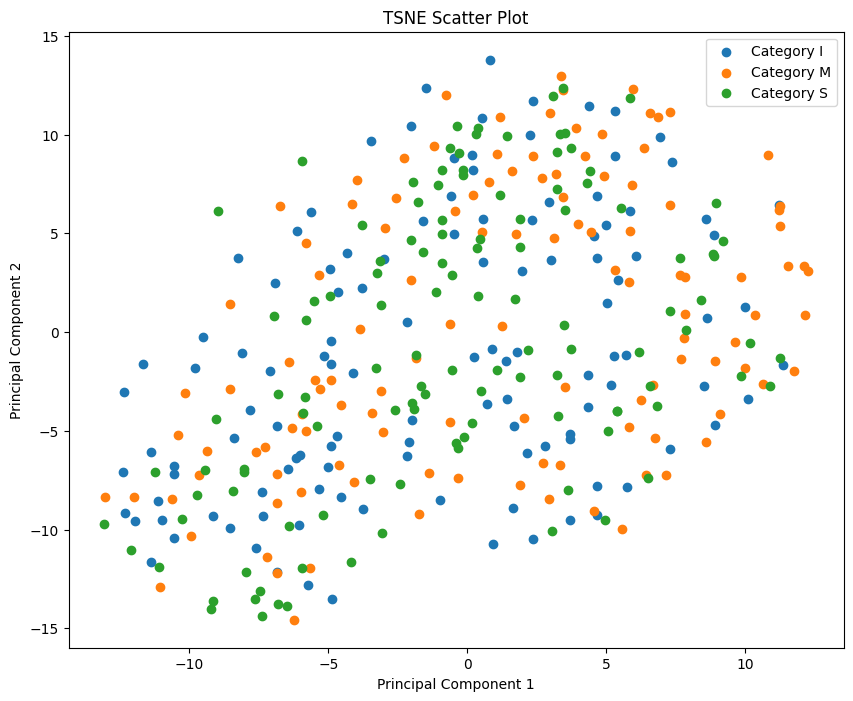

In [ ]:
# Perform t-SNE to reduce the data to 2 dimensions
tsne = TSNE(n_components=2, random_state=0)
%time X_tsne = tsne.fit_transform(images.reshape(num_samples, height * width * channels))

# Create a scatter plot
plt.figure(figsize=(10, 8))
for category in sorted(set(categories)):
    # Select images and their corresponding labels for the current category
    category_images = X_tsne[np.array(categories) == category]
    #plt.scatter(category_images[:, 0], category_images[:, 1], c=color, label=f'Category {category}')
    plt.scatter(category_images[:, 0], category_images[:, 1], cmap="binary", label=f'Category {category}')

# Set labels and legend
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('TSNE Scatter Plot')
plt.legend(loc='best')

# Show the plot
plt.show()

Text(0.5, 1.0, 'T-SNE Plot with Rock Images')

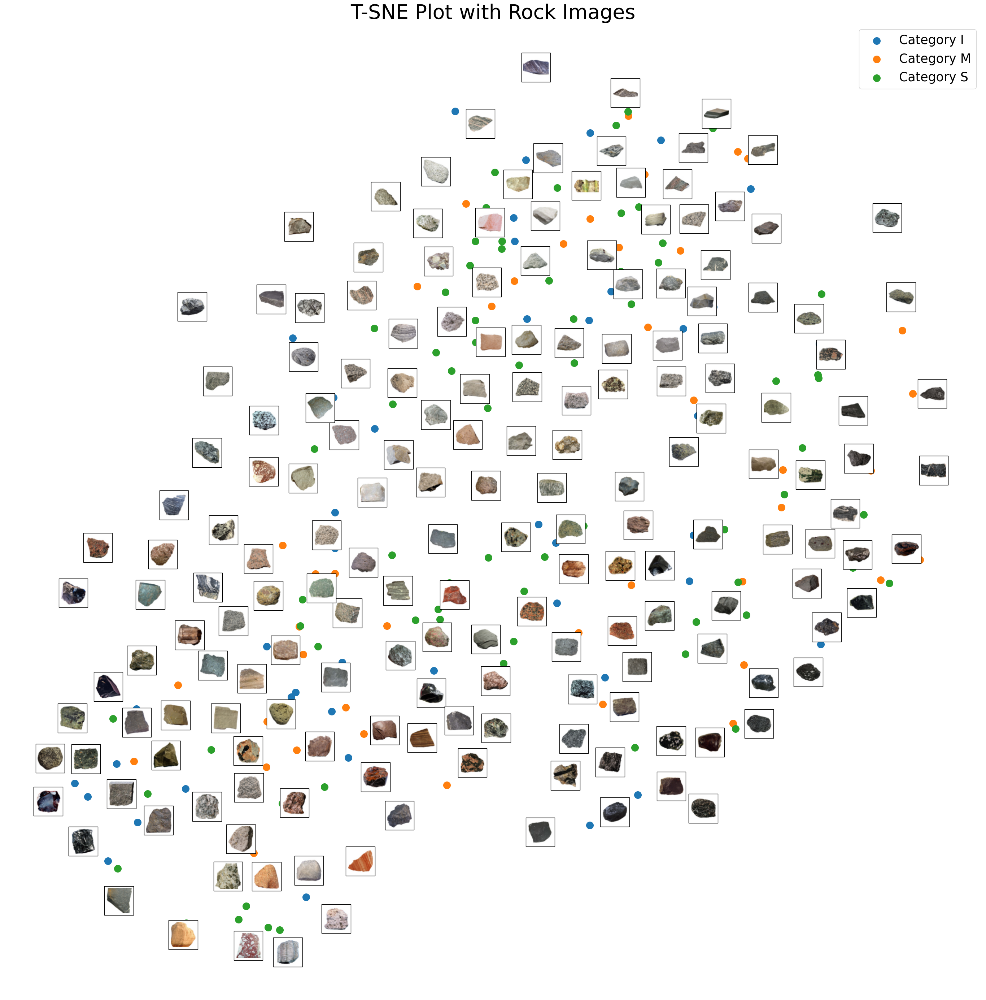

In [ ]:
# Plotting the required plot
plot_rocks(X_tsne,categories,rock_images=images.reshape(num_samples, height * width * channels),figsize=(35, 35))
plt.title('T-SNE Plot with Rock Images', fontsize=40)

**3.2 With LLE**

CPU times: user 13.5 s, sys: 445 ms, total: 13.9 s
Wall time: 12.5 s


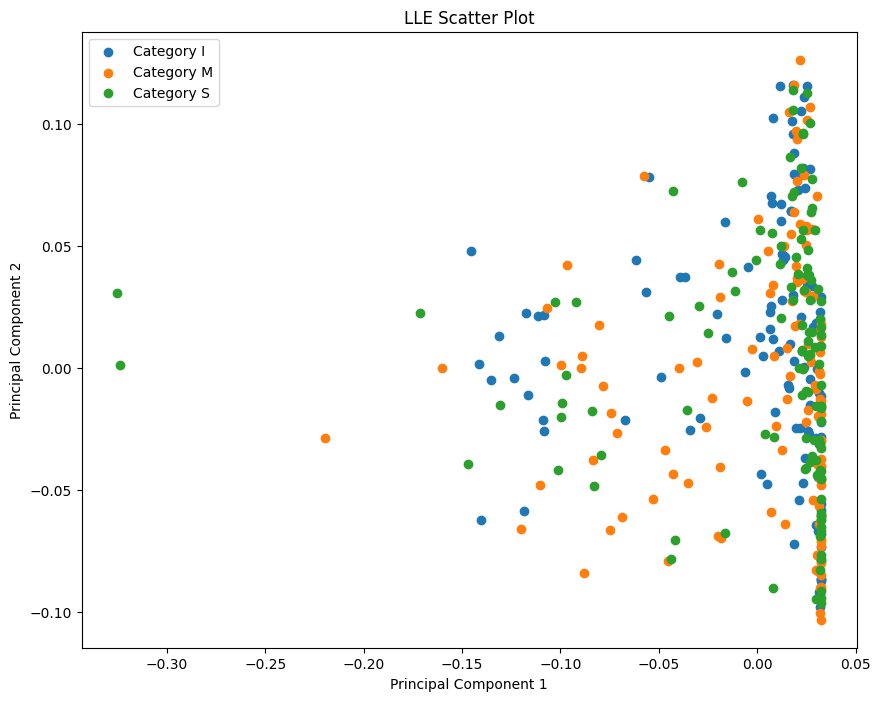

In [ ]:
# Perform LLE to reduce the data to 2 dimensions
lle = LocallyLinearEmbedding(n_components=2, n_neighbors=5, random_state=0)
%time X_lle = lle.fit_transform(images.reshape(num_samples, height * width * channels))

# Create a scatter plot
plt.figure(figsize=(10, 8))
for category in sorted(set(categories)):
    # Select images and their corresponding labels for the current category
    category_images = X_lle[np.array(categories) == category]
    plt.scatter(category_images[:, 0], category_images[:, 1], cmap="binary", label=f'Category {category}')

# Set labels and legend
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(loc='best')
plt.title('LLE Scatter Plot')
# Show the plot
plt.show()


Text(0.5, 1.0, 'LLE Plot with Rock Images')

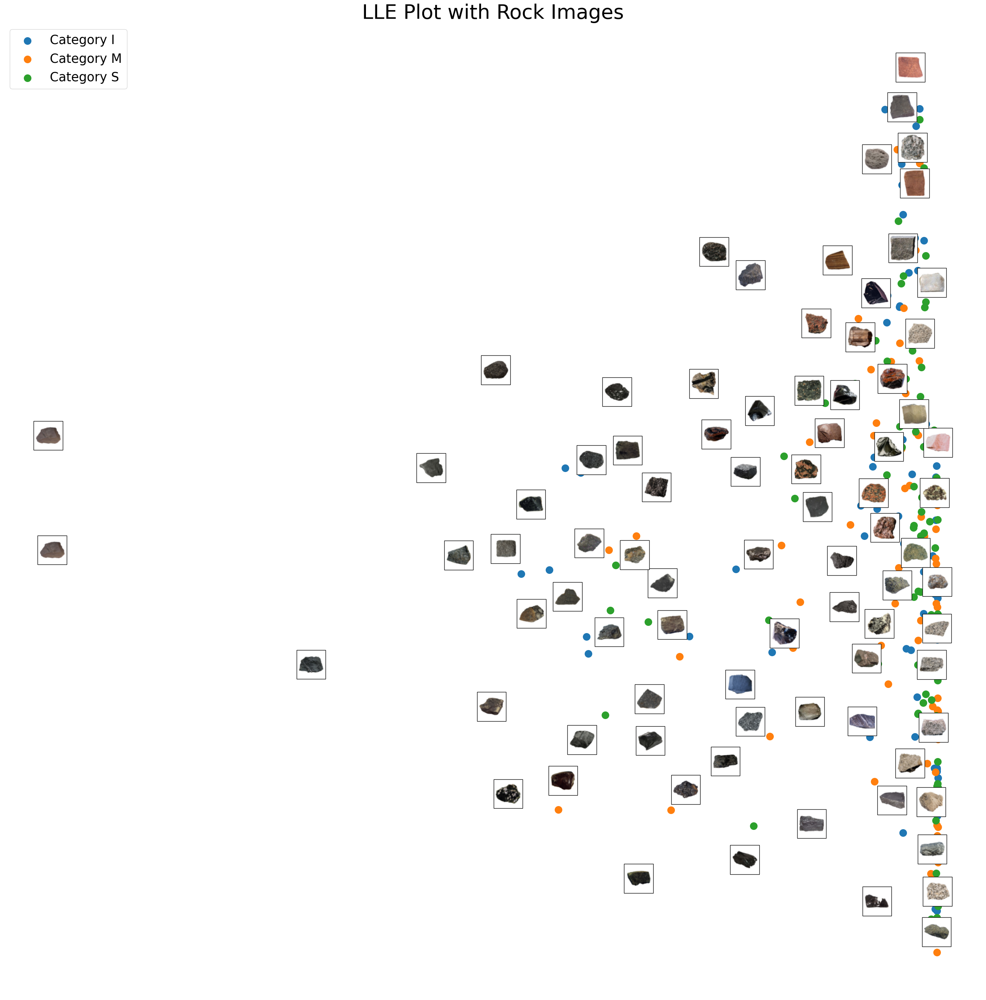

In [ ]:
# Plotting the required plot
plot_rocks(X_lle,categories,rock_images=images.reshape(num_samples, height * width * channels),figsize=(35, 35))
plt.title('LLE Plot with Rock Images', fontsize=40)

**3.2 With mds**

CPU times: user 8.32 s, sys: 4.98 s, total: 13.3 s
Wall time: 11.9 s


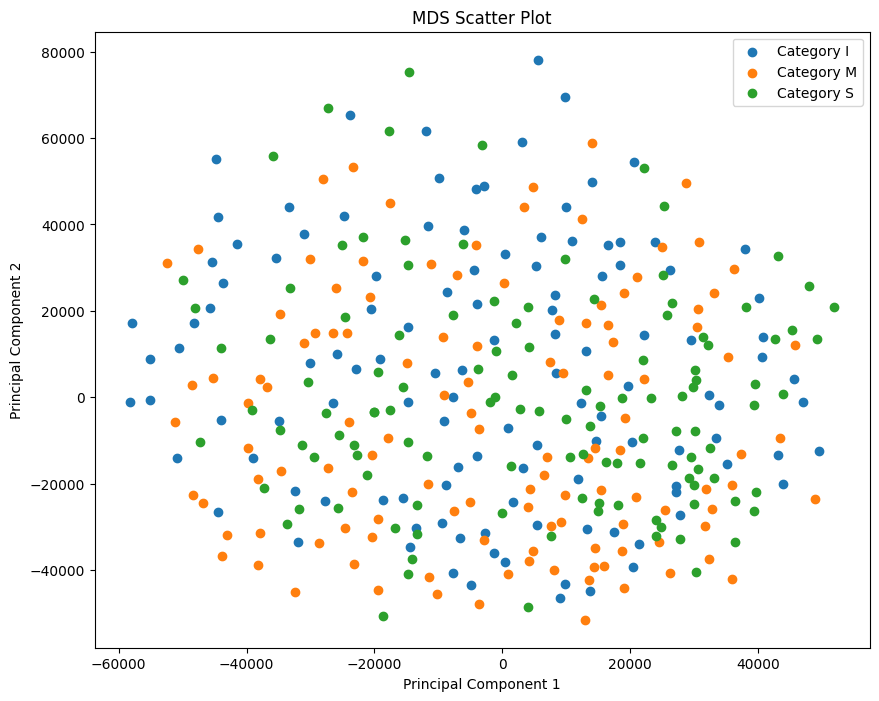

In [ ]:
# Perform MDS to reduce the data to 2 dimensions
mds = MDS(n_components=2, random_state=0)
%time X_mds = mds.fit_transform(images.reshape(num_samples, height * width * channels))

# Create a scatter plot
plt.figure(figsize=(10, 8))
for category in sorted(set(categories)):
    # Select images and their corresponding labels for the current category
    category_images = X_mds[np.array(categories) == category]
    plt.scatter(category_images[:, 0], category_images[:, 1], cmap="binary", label=f'Category {category}')

# Set labels and legend
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(loc='best')
plt.title('MDS Scatter Plot')
# Show the plot
plt.show()


Text(0.5, 1.0, 'MDS Plot with Rock Images')

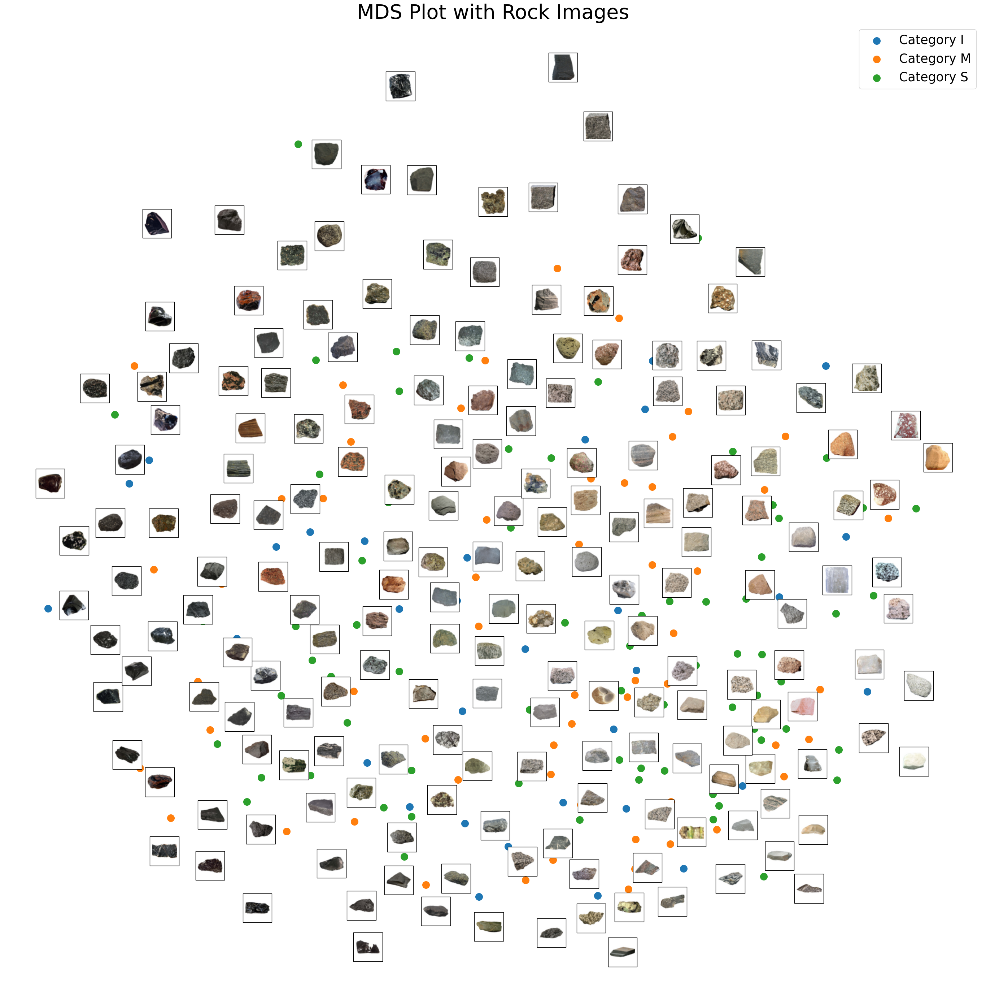

In [ ]:
# Plotting the required plot
plot_rocks(X_mds,categories,rock_images=images.reshape(num_samples, height * width * channels),figsize=(35, 35))
plt.title('MDS Plot with Rock Images', fontsize=40)

**3.3 Which of the visualizations do you prefer?**

- Among the methods, MDS exhibits the shortest overall CPU time, clocking in at 8.32 seconds, with LLE and PCA trailing closely behind in terms of runtime.
- T-SNE records the lengthiest CPU time, taking 31.3s to complete.
- The scatter plots generated by PCA, T-SNE, and MDS appear similar, whereas LLE falls short as it results in considerable overlap among data points from distinct categories.

**4. Now let's see if these dimensionality reduction techniques can give us similar features to those that humans use to judge the images. File mds_360.txt contains 8 features for each of the images (rankings are in the same order as the images in  '360 Rocks' folder. Run PCA, t-SNE, LLE and MDS to reduce the dimensionality of the images to 8.**

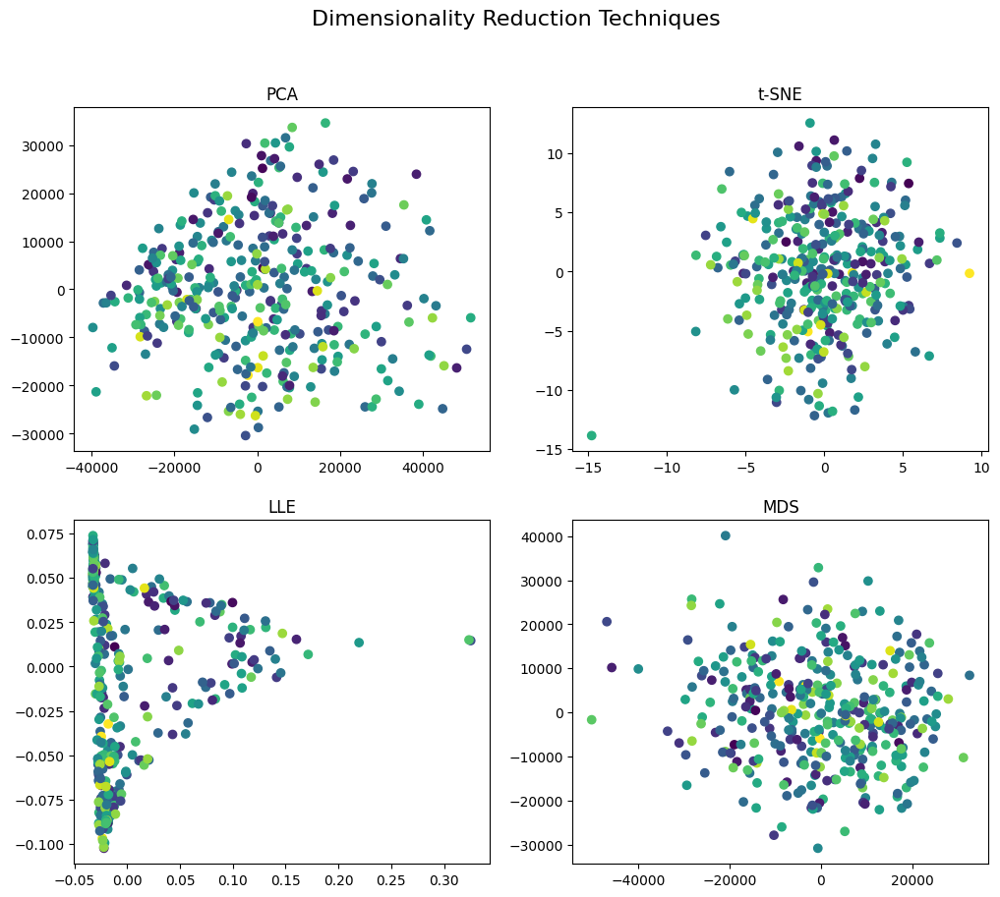

In [ ]:
from sklearn.preprocessing import StandardScaler

# Load the features from 'mds_360.txt'
features = np.loadtxt('mds_360.txt')

# Standardize the features
scaler = StandardScaler()
features_standardized = scaler.fit_transform(features)

# Assuming X contains your image data

# Apply PCA to reduce dimensionality to 8
pca_8d = PCA(n_components=8)
X_8d_pca = pca_8d.fit_transform(images.reshape(num_samples, height * width * channels))

# Apply t-SNE
tsne_8d = TSNE(n_components=8, method='exact')
X_8d_tsne = tsne_8d.fit_transform(images.reshape(num_samples, height * width * channels))

# Apply LLE
lle_8d = LocallyLinearEmbedding(n_components=8)
X_8d_lle = lle_8d.fit_transform(images.reshape(num_samples, height * width * channels))

# Apply MDS
mds_8d = MDS(n_components=8)
X_8d_mds = mds_8d.fit_transform(images.reshape(num_samples, height * width * channels))

# Plot the results
fig, axes = plt.subplots(2, 2, figsize=(12, 10))
fig.suptitle('Dimensionality Reduction Techniques', fontsize=16)

# Plot PCA
axes[0, 0].scatter(X_8d_pca[:, 0], X_8d_pca[:, 1], c=features_standardized[:, 0], cmap='viridis')
axes[0, 0].set_title('PCA')

# Plot t-SNE
axes[0, 1].scatter(X_8d_tsne[:, 0], X_8d_tsne[:, 1], c=features_standardized[:, 0], cmap='viridis')
axes[0, 1].set_title('t-SNE')

# Plot LLE
axes[1, 0].scatter(X_8d_lle[:, 0], X_8d_lle[:, 1], c=features_standardized[:, 0], cmap='viridis')
axes[1, 0].set_title('LLE')

# Plot MDS
axes[1, 1].scatter(X_8d_mds[:, 0], X_8d_mds[:, 1], c=features_standardized[:, 0], cmap='viridis')
axes[1, 1].set_title('MDS')

plt.show()


**4b. Then, compare those image embeddings with the ones from humans that are in the mds_360.txt file. Use Procrustes analysis to do the comparison (here is one example of how to do that mtx1, mtx2, disparity = procrustes(matrix_with_human_data, matrix_with_pca_embeddings_data). Here matrix_with_human_data and matrix_with_pca_embeddings_data should be 360 by 8. disparity will tell you the difference in the data. Report disparity for each of the four dimensionality reduction methods. Compute the correlation coefficient between each dimension of mtx1 and mtx2 for each of the four methods - display results in a table.**

In [ ]:
procrustes_results = []
correlation_coefficients = []
for embedding_result in [X_8d_pca, X_8d_tsne, X_8d_lle, X_8d_mds]:
    # Ensure both matrices have the same shape
    num_rows, num_cols = min(features.shape[0], embedding_result.shape[0]), min(features.shape[1], embedding_result.shape[1])
    features_subset = features[:num_rows, :num_cols]
    embedding_result_subset = embedding_result[:num_rows, :num_cols]

    # Apply Procrustes analysis
    _, _, disparity = procrustes(features_subset, embedding_result_subset)
    procrustes_results.append(disparity)
    correlation_matrix = np.corrcoef(features_subset.T, embedding_result_subset.T)
    correlation_coefficients.append(correlation_matrix[:8, 8:])

# Display results
for i, method in enumerate(["PCA", "t-SNE", "LLE", "MDS"]):
    print(f"Method: {method}")
    print(f"Procrustes Disparity: {procrustes_results[i]}")
    print("Correlation Coefficients:")
    print(correlation_coefficients[i])
    print("\n")


Method: PCA
Procrustes Disparity: 0.9764783041269864
Correlation Coefficients:
[[-0.06740444 -0.20600535  0.04080568 -0.06810481 -0.06178103  0.05732507
   0.05722404  0.0048194 ]
 [ 0.11940028  0.02849295 -0.06876892  0.00553606 -0.07509747  0.00707645
  -0.02749388  0.05527482]
 [-0.00363399  0.0520281  -0.05036332  0.03544975 -0.06856954  0.02243233
   0.03484994  0.00605555]
 [ 0.06490819  0.00565188 -0.02541212  0.01873377  0.04179798 -0.04031709
  -0.09463435 -0.03023175]
 [ 0.02177751  0.01431127 -0.04111079  0.00652099  0.02596159  0.08802724
   0.0844865   0.11737792]
 [-0.12772742 -0.05403766  0.01563474  0.00026329 -0.00308228  0.03995779
  -0.05292101 -0.02311667]
 [ 0.03880104  0.05718124 -0.05516236 -0.14608064 -0.08108626 -0.01901404
  -0.03330768  0.15577757]
 [ 0.00406187  0.06482022 -0.05578865  0.02043907 -0.11609749  0.04209531
  -0.05730198  0.10473821]]


Method: t-SNE
Procrustes Disparity: 0.9784918664962532
Correlation Coefficients:
[[-0.12986    -0.15488521  0.

5. Cluster the 360 images using K-Means.
  1.   To speed up the algorithm, use PCA to reduce the dimensionality of the dataset to two. Determine the number of clusters using one of the techniques we discussed in class.
  2.   Visualization.

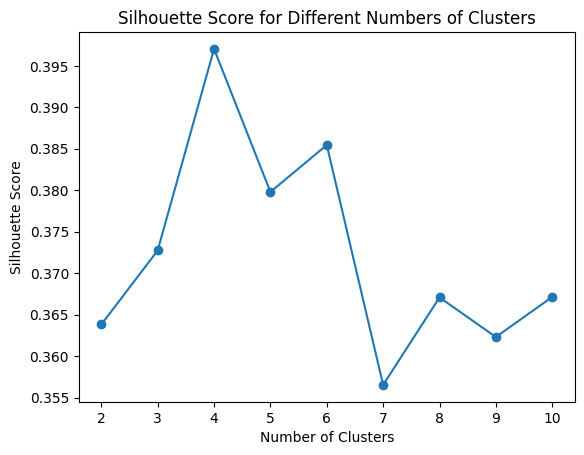

Optimal number of clusters: 4


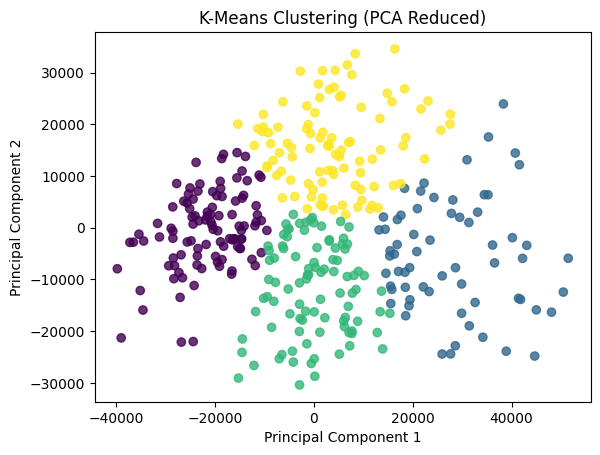

In [ ]:
pca = PCA(n_components=2)
X_2d_pca = pca.fit_transform(images.reshape(num_samples, height * width * channels))
# Determine the number of clusters using silhouette score
silhouette_scores = []
possible_cluster_range = range(2, 11)  # You can adjust the range based on your needs

for n_clusters in possible_cluster_range:
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    cluster_labels = kmeans.fit_predict(X_2d_pca)
    silhouette_avg = silhouette_score(X_2d_pca, cluster_labels)
    silhouette_scores.append(silhouette_avg)

# Plot silhouette scores to help determine the optimal number of clusters
plt.plot(possible_cluster_range, silhouette_scores, marker='o')
plt.title('Silhouette Score for Different Numbers of Clusters')
plt.xlabel('Number of Clusters')
plt.ylabel('Silhouette Score')
plt.show()

# Choose the optimal number of clusters based on the plot or other criteria
optimal_num_clusters = possible_cluster_range[np.argmax(silhouette_scores)]
print(f'Optimal number of clusters: {optimal_num_clusters}')

# Perform K-Means clustering with the optimal number of clusters
kmeans_optimal = KMeans(n_clusters=optimal_num_clusters, random_state=42)
cluster_labels_optimal = kmeans_optimal.fit_predict(X_2d_pca)

# Visualize the clusters in 2D
plt.scatter(X_2d_pca[:, 0], X_2d_pca[:, 1], c=cluster_labels_optimal, cmap='viridis', alpha=0.8)
plt.title('K-Means Clustering (PCA Reduced)')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.show()


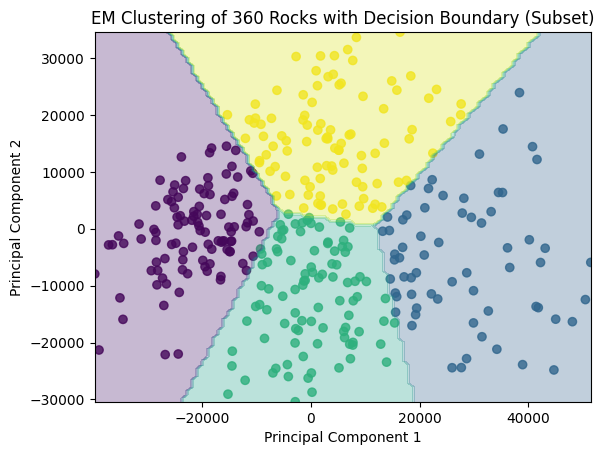

In [ ]:
plt.scatter(X_2d_pca[:, 0], X_2d_pca[:, 1], c=cluster_labels_optimal, cmap='viridis', alpha=0.8)
segment_size = 500
for i in range(0, len(X_2d_pca), segment_size):
    segment = X_2d_pca[i:i + segment_size]
    xx, yy = np.meshgrid(np.linspace(segment[:, 0].min(), segment[:, 0].max(), 100),
                         np.linspace(segment[:, 1].min(), segment[:, 1].max(), 100))

    Z = kmeans_optimal.predict(np.c_[xx.ravel(), yy.ravel()])
    Z = Z.reshape(xx.shape)

    # Plot decision boundary
    plt.contourf(xx, yy, Z, alpha=0.3, cmap='viridis')

plt.title('EM Clustering of 360 Rocks with Decision Boundary (Subset)')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.show()

6. Cluster the 360 images using EM.
  1.   Same as in the previous question, to speed up the algorithm, use PCA to reduce the dimensionality of the dataset to two. Determine the number of clusters using one of the techniques we discussed in class.
  2.   Visualization.




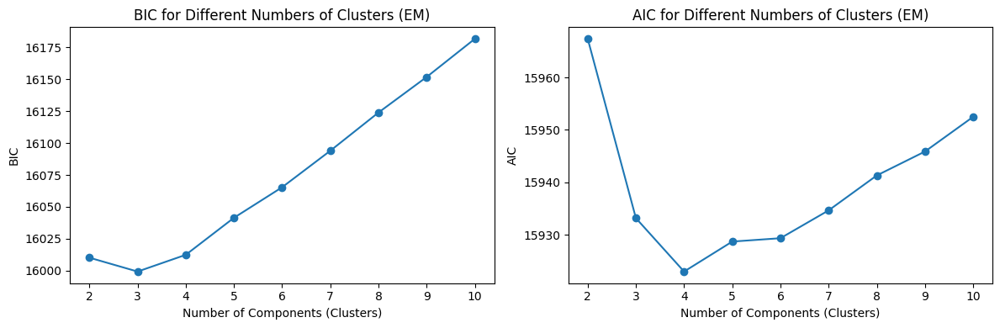

Optimal number of components using BIC: 3
Optimal number of components using AIC: 4


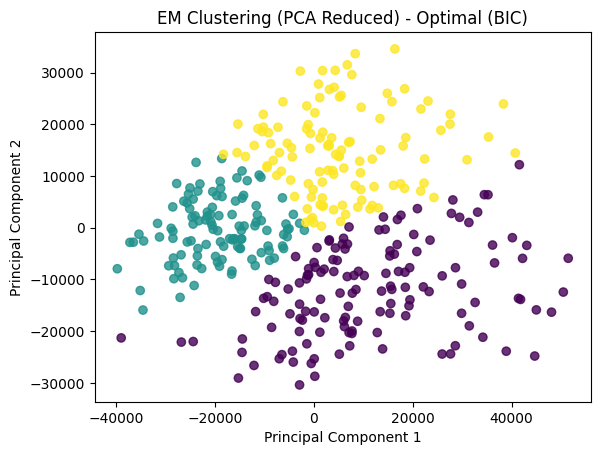

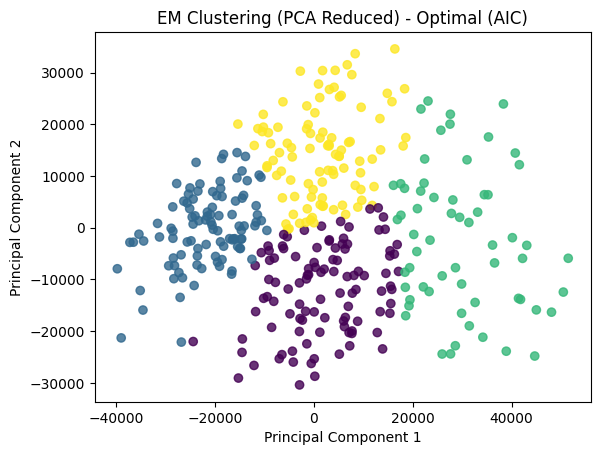

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.mixture import GaussianMixture
from sklearn.metrics import silhouette_score, davies_bouldin_score

# Assuming X_2d_pca contains the 2D PCA reduced data

# Determine the number of clusters using BIC and AIC
bic_scores = []
aic_scores = []
possible_cluster_range = range(2, 11)  # You can adjust the range based on your needs

for n_components in possible_cluster_range:
    gmm = GaussianMixture(n_components=n_components, random_state=42)
    gmm.fit(X_2d_pca)
    bic_scores.append(gmm.bic(X_2d_pca))
    aic_scores.append(gmm.aic(X_2d_pca))

# Plot BIC and AIC scores to help determine the optimal number of clusters
plt.figure(figsize=(12, 4))

plt.subplot(1, 2, 1)
plt.plot(possible_cluster_range, bic_scores, marker='o')
plt.title('BIC for Different Numbers of Clusters (EM)')
plt.xlabel('Number of Components (Clusters)')
plt.ylabel('BIC')

plt.subplot(1, 2, 2)
plt.plot(possible_cluster_range, aic_scores, marker='o')
plt.title('AIC for Different Numbers of Clusters (EM)')
plt.xlabel('Number of Components (Clusters)')
plt.ylabel('AIC')

plt.tight_layout()
plt.show()

# Choose the optimal number of components (clusters) based on BIC or AIC
optimal_num_components_bic = possible_cluster_range[np.argmin(bic_scores)]
optimal_num_components_aic = possible_cluster_range[np.argmin(aic_scores)]

print(f'Optimal number of components using BIC: {optimal_num_components_bic}')
print(f'Optimal number of components using AIC: {optimal_num_components_aic}')

# Perform EM clustering with the optimal number of components (BIC)
gmm_optimal_bic = GaussianMixture(n_components=optimal_num_components_bic, random_state=42)
cluster_labels_optimal_bic = gmm_optimal_bic.fit_predict(X_2d_pca)

# Perform EM clustering with the optimal number of components (AIC)
gmm_optimal_aic = GaussianMixture(n_components=optimal_num_components_aic, random_state=42)
cluster_labels_optimal_aic = gmm_optimal_aic.fit_predict(X_2d_pca)

# Visualize the clusters in 2D for BIC
plt.scatter(X_2d_pca[:, 0], X_2d_pca[:, 1], c=cluster_labels_optimal_bic, cmap='viridis', alpha=0.8)
plt.title('EM Clustering (PCA Reduced) - Optimal (BIC)')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.show()

# Visualize the clusters in 2D for AIC
plt.scatter(X_2d_pca[:, 0], X_2d_pca[:, 1], c=cluster_labels_optimal_aic, cmap='viridis', alpha=0.8)
plt.title('EM Clustering (PCA Reduced) - Optimal (AIC)')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.show()


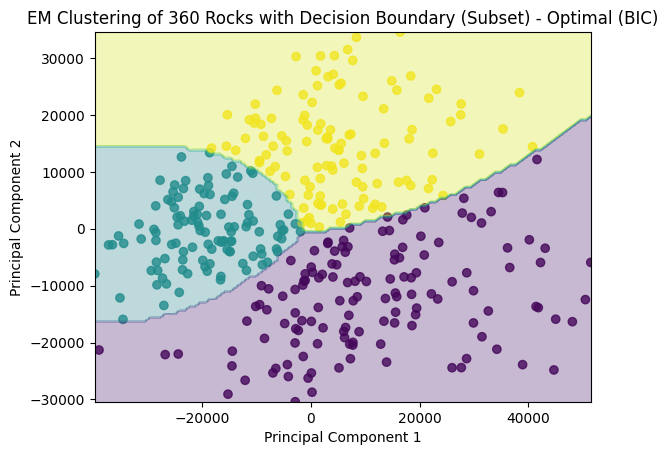

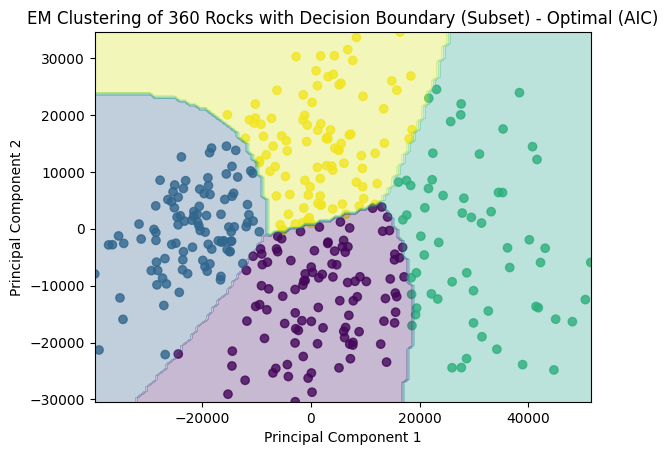

In [ ]:
plt.scatter(X_2d_pca[:, 0], X_2d_pca[:, 1], c=cluster_labels_optimal_bic, cmap='viridis', alpha=0.8)
segment_size = 500
for i in range(0, len(X_2d_pca), segment_size):
    segment = X_2d_pca[i:i + segment_size]
    xx, yy = np.meshgrid(np.linspace(segment[:, 0].min(), segment[:, 0].max(), 100),
                         np.linspace(segment[:, 1].min(), segment[:, 1].max(), 100))

    Z = gmm_optimal_bic.predict(np.c_[xx.ravel(), yy.ravel()])
    Z = Z.reshape(xx.shape)

    # Plot decision boundary
    plt.contourf(xx, yy, Z, alpha=0.3, cmap='viridis')

plt.title('EM Clustering of 360 Rocks with Decision Boundary (Subset) - Optimal (BIC)')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.show()
plt.scatter(X_2d_pca[:, 0], X_2d_pca[:, 1], c=cluster_labels_optimal_aic, cmap='viridis', alpha=0.8)
segment_size = 500
for i in range(0, len(X_2d_pca), segment_size):
    segment = X_2d_pca[i:i + segment_size]
    xx, yy = np.meshgrid(np.linspace(segment[:, 0].min(), segment[:, 0].max(), 100),
                         np.linspace(segment[:, 1].min(), segment[:, 1].max(), 100))

    Z = gmm_optimal_aic.predict(np.c_[xx.ravel(), yy.ravel()])
    Z = Z.reshape(xx.shape)

    # Plot decision boundary
    plt.contourf(xx, yy, Z, alpha=0.3, cmap='viridis')

plt.title('EM Clustering of 360 Rocks with Decision Boundary (Subset) - Optimal (AIC)')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.show()

**6. c)Use the model to generate 20 new rocks (using the sample() method), and visualize them in the original image space (since you used PCA, you will need to use its inverse_transform() method).**

Recovered Size = (20, 400, 400, 3)


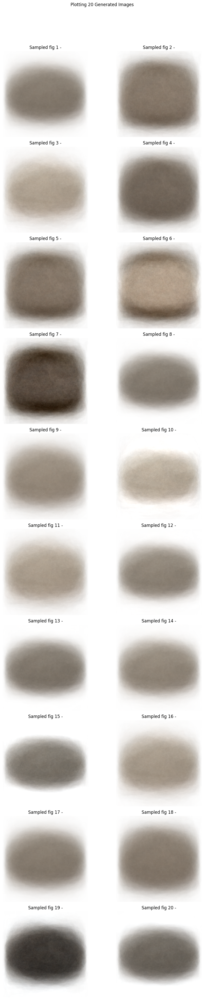

In [ ]:
# Assuming you have determined the optimal number of components for GMM
optimal_num_components = 3  # Change this based on your analysis

# Fit a Gaussian Mixture Model
gmm = GaussianMixture(n_components=optimal_num_components, random_state=42)
gmm.fit(X_2d_pca)

# Generate 20 new samples in PCA space
n_samples = 20
sample_20, sample_y = gmm.sample(n_samples)
X_recovered = pca.inverse_transform(sample_20)
X_recovered = X_recovered.reshape(n_samples, 400, 400, 3)
print(f"Recovered Size = {X_recovered.shape}")

# Visualizing the Generated Images

num_images_to_plot = len(X_recovered)

# Determining the number of rows and columns dynamically
rows = int(math.ceil(num_images_to_plot / 2))
cols = 2

#Adjusting individual image sizes in the plot
image_size = 4

# Create a 10x2 grid for displaying images
fig, axes = plt.subplots(rows, cols, figsize=(10, rows*4))

# Plotting the reconstructed images generated by GMM
a = 0
for i in range(rows):
    for j in range(cols):
        if a < num_images_to_plot:
            reconstructed_image = X_recovered[a].reshape(400, 400, 3)
            axes[i,j].imshow(reconstructed_image.astype(int), extent=[0, image_size, 0, image_size])
            axes[i,j].set_title(f"Sampled fig {a+1} -")
            axes[i,j].axis("off")
            a = a + 1
        else:
            axes[i, j].axis("off")

plt.suptitle("Plotting 20 Generated Images")
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()



**7.1 Report the training time (use code to do this).**

In [ ]:
import os
import pandas as pd
from PIL import Image
import numpy as np
import tensorflow as tf
from tensorflow.keras import layers
from tensorflow import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten, Conv2D, MaxPooling2D
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import time
# Directory containing all the images
image_dir = '/content/drive/My Drive/360 Rocks'  # Replace with the actual path to your image directory

# List all image filenames in the directory
image_filenames = [f for f in os.listdir(image_dir) if f.endswith('.jpg')]

# Extract class labels from the first letter of the filenames
class_labels = [filename[0] for filename in image_filenames]
image_paths = [os.path.join(image_dir, filename) for filename in image_filenames]
img_height = 224
img_width = 224

# Set up data generator
datagen = ImageDataGenerator(rescale=1.0/255)

# Create image data generator for training
train_generator = datagen.flow_from_dataframe(
    dataframe=pd.DataFrame({'filepath': image_paths, 'class_label': class_labels}),
    x_col='filepath',
    y_col='class_label',
    target_size=(img_width, img_height),
    batch_size=32,
    subset='training',
    class_mode='categorical',
    shuffle=True,
    seed=42  # Added seed for reproducibility
)

# Create image data generator for validation using '120 Rocks' folder
validation_dir = '/content/drive/MyDrive/120 Rocks'  # Replace with the actual path to your validation directory
validation_image_filenames = [f for f in os.listdir(validation_dir) if f.endswith('.jpg')]
validation_image_paths = [os.path.join(validation_dir, filename) for filename in validation_image_filenames]

validation_generator = datagen.flow_from_dataframe(
    dataframe=pd.DataFrame({'filepath': validation_image_paths, 'class_label': [filename[0] for filename in validation_image_filenames]}),
    x_col='filepath',
    y_col='class_label',
    target_size=(img_width, img_height),
    batch_size=32,
    class_mode='categorical',
    shuffle=False
)

# Build the neural network model
model = keras.Sequential(
    [
        layers.Conv2D(32, (3, 3), activation='relu', input_shape=(img_height, img_width, 3)),
        layers.MaxPooling2D(pool_size=(2, 2)),
        layers.Conv2D(64, (3, 3), activation='relu'),
        layers.MaxPooling2D(pool_size=(2, 2)),
        layers.Conv2D(128, (3, 3), activation='relu'),
        layers.MaxPooling2D(pool_size=(2, 2)),
        layers.Flatten(),
        layers.Dense(256, activation='relu'),
        layers.Dense(8, activation='relu'),
        layers.Dense(3, activation='softmax')
    ]
)

# Compile the model
model.compile(
    optimizer='adam',
    loss='categorical_crossentropy',
    metrics=['accuracy']
)
start_time = time.time()
# Compile and train the model
history = model.fit(
    train_generator,
    epochs=10,
    validation_data=validation_generator,
    steps_per_epoch=train_generator.samples // train_generator.batch_size,
    validation_steps=validation_generator.samples // validation_generator.batch_size
)
end_time = time.time()
training_time = end_time - start_time
print(f"Training time: {training_time} seconds")
# Rest of the code for evaluation and visualization


Found 360 validated image filenames belonging to 3 classes.
Found 120 validated image filenames belonging to 3 classes.
Epoch 1/10
11/11 [==============================] - 55s 4s/step - loss: 1.2195 - accuracy: 0.3232 - val_loss: 1.0987 - val_accuracy: 0.3229
Epoch 2/10
11/11 [==============================] - 49s 4s/step - loss: 1.0988 - accuracy: 0.3201 - val_loss: 1.0987 - val_accuracy: 0.3229
Epoch 3/10
11/11 [==============================] - 52s 5s/step - loss: 1.0987 - accuracy: 0.3354 - val_loss: 1.0987 - val_accuracy: 0.3333
Epoch 4/10
11/11 [==============================] - 51s 5s/step - loss: 1.0987 - accuracy: 0.3049 - val_loss: 1.0987 - val_accuracy: 0.3333
Epoch 5/10
11/11 [==============================] - 50s 5s/step - loss: 1.0987 - accuracy: 0.3293 - val_loss: 1.0987 - val_accuracy: 0.3333
Epoch 6/10
11/11 [==============================] - 54s 5s/step - loss: 1.0986 - accuracy: 0.3352 - val_loss: 1.0987 - val_accuracy: 0.3333
Epoch 7/10
11/11 [======================

**7.2. Plot training and validation loss and accuracy as a function of training epochs.**

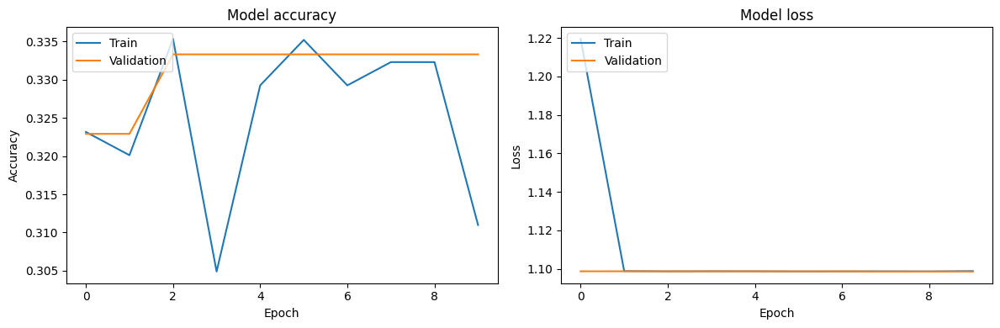

In [ ]:
import matplotlib.pyplot as plt

# Plot training history
plt.figure(figsize=(12, 4))

# Plot training & validation accuracy values
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(['Train', 'Validation'], loc='upper left')

# Plot training & validation loss values
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(['Train', 'Validation'], loc='upper left')

plt.tight_layout()
plt.show()


**7.3 How many parameters does the network have? How many of those parameters are bias parameters?**

In [ ]:
total_params = model.count_params()
bias_params = sum([np.prod(p.shape) for p in model.trainable_weights if 'bias' in p.name])

print(f"Total parameters: {total_params}")
print(f"Bias parameters: {bias_params}")


Total parameters: 22246755
Bias parameters: 491


**7.4 Compare the activity of neurons in the next to the last layer (the one with 8 neurons) with the human data. (to get human data use mds_360.txt and mds_120.txt files). Similar to before, use Procrustes analysis to do the comparison.  For training and validation data (separately), report disparity and compute the correlation coefficient between each dimension of mtx1 and mtx2. Display results in a table.**

In [ ]:
from tensorflow.keras import Model

# Create a new model that outputs the activations of the desired layer
activation_model = Model(inputs=model.input, outputs=model.layers[-2].output)

# Get the activations for the training and validation sets
train_activations = activation_model.predict(X_train_tf)
valid_activations = activation_model.predict(X_valid_tf)

# Load human rankings data
human_data_train = np.loadtxt('/content/drive/MyDrive/AML Projects/HomeWork3/mds_360.txt')
human_data_valid = np.loadtxt('/content/drive/MyDrive/AML Projects/HomeWork3/mds_120.txt')

# Perform Procrustes analysis for training data
_, _, disparity_train = procrustes(human_data_train, train_activations)
correlation_coeffs_train = [pearsonr(human_data_train[:, i], train_activations[:, i])[0] for i in range(8)]

# Perform Procrustes analysis for validation data
_, _, disparity_valid = procrustes(human_data_valid, valid_activations)
correlation_coeffs_valid = [pearsonr(human_data_valid[:, i], valid_activations[:, i])[0] for i in range(8)]

# Display results in a table
print("Training Data:")
print("Disparity:", disparity_train)

print("\nValidation Data:")
print("Disparity:", disparity_valid)

In [ ]:
from tensorflow.keras.models import Model

# Modifing the neural network model to create a new model
intermediate_layer_model = Model(inputs=model.input,outputs=model.layers[-2].output)
# Extracting the activations for training and validation data
train_activations = intermediate_layer_model.predict(train_images)
val_activations = intermediate_layer_model.predict(val_images)

def load_human_data(file_path):
    return np.loadtxt(file_path)

human_data_360 = load_human_data('/content/drive/MyDrive/mds_360.txt')
human_data_120 = load_human_data('/content/drive/MyDrive/mds_120.txt')

from scipy.spatial import procrustes
from scipy.stats import pearsonr


mtx1_train, mtx2_train, disparity_train = procrustes(train_activations, human_data_360)

corr_coeffs_train = [pearsonr(mtx1_train[:, i], mtx2_train[:, i])[0] for i in range(mtx1_train.shape[1])]

mtx1_val, mtx2_val, disparity_val = procrustes(val_activations, human_data_120)

corr_coeffs_val = [pearsonr(mtx1_val[:, i], mtx2_val[:, i])[0] for i in range(mtx1_val.shape[1])]


results = {
    'Data': ['Training', 'Validation'],
    'Disparity': [disparity_train, disparity_val],
    'Correlation Coefficient Dimension 1': [corr_coeffs_train[0], corr_coeffs_val[0]],
    'Correlation Coefficient Dimension 2': [corr_coeffs_train[1], corr_coeffs_val[1]],
}

results_df = pd.DataFrame(results)
print(results_df)

NameError: ignored